In [49]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
import seaborn as sns

## Sample and Population

In [2]:
X,y = make_regression(n_samples=1000, n_features=5, random_state=0)
print(X.shape,y.shape)

(1000, 5) (1000,)


In [3]:
df = pd.DataFrame(X,columns=['x1','x2','x3','x4','x5'])
df['y'] = y
df.head()

,x1,x2,x3,x4,x5,y
0,-0.235503,2.011243,-1.377019,1.121907,1.392837,85.941034
1,-0.801497,0.271170,-0.525641,-0.887780,0.936399,-10.107882
2,0.350266,-1.193258,0.971970,-2.086510,-0.590757,-31.484509
3,-2.083592,-0.864048,-0.971342,0.691785,0.564388,-142.935500
4,0.239146,0.531043,0.206691,-0.033319,-1.530803,-65.455715


In [4]:
sample_size=500
sample = df.sample(n=sample_size, random_state=1)

In [5]:
print(f"Sample mean is {sample['y'].mean()}, and the population mean is {y.mean()}")
print(f"Sample variance is {sample['y'].var()}, and the population variance is {y.var()}")

Sample mean is 2.4089920648597847, and the population mean is -0.0867743440519954
Sample variance is 10028.353422391343, and the population variance is 9830.181265682395


## Margin of Error and Confidence Interval

In [6]:
from sklearn.utils import shuffle
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]
feat = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT']
df = pd.DataFrame(data, columns = feat)
df['target'] = target
df = shuffle(df)

In [7]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
170,1.20742,0.0,19.58,0.0,0.605,5.875,94.6,2.4259,5.0,403.0,14.7,292.29,14.43,17.4
307,0.04932,33.0,2.18,0.0,0.472,6.849,70.3,3.1827,7.0,222.0,18.4,396.90,7.53,28.2
286,0.01965,80.0,1.76,0.0,0.385,6.230,31.5,9.0892,1.0,241.0,18.2,341.60,12.93,20.1
493,0.17331,0.0,9.69,0.0,0.585,5.707,54.0,2.3817,6.0,391.0,19.2,396.90,12.01,21.8
80,0.04113,25.0,4.86,0.0,0.426,6.727,33.5,5.4007,4.0,281.0,19.0,396.90,5.29,28.0


In [8]:
sample_size = 200
sample = df.sample(n=sample_size,random_state=1)

In [9]:
from scipy import stats
from math import sqrt

In [11]:
# sample mean and sample standard deviation
sample_mean = sample['target'].mean()
sample_std = sample["target"].std()

In [15]:
# z_(alpa/2) for 95% confidence interval
z_critical = stats.norm.ppf(q=0.975)
print("Z-critical value is", z_critical)

Z-critical value is 1.959963984540054


In [14]:
# margin of error
margin_of_error = z_critical * (sample_std/sqrt(sample_size))
print("Margin of error is", margin_of_error)

Margin of error is 1.3310427853045697


In [16]:
# confidence interval 
confidence_interval = (sample_mean - margin_of_error,
                       sample_mean + margin_of_error)
print("confidence interval value is", confidence_interval)

confidence interval value is (22.081457214695433, 24.74354278530457)


## Hypothesis Testing

##### Z test

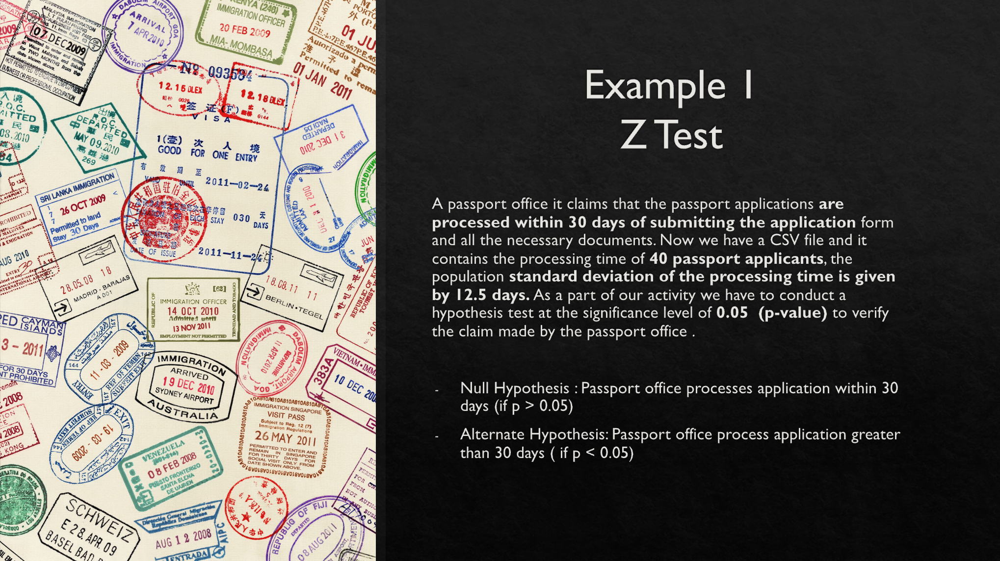

In [25]:
# given
pop_mean = 30
pop_std = 12.5
n = 40

In [23]:
df = pd.read_csv("/Users/saprativasarkar/Desktop/ML/10_Python_and_OOPS/11_statistics/dataset/processing_time_40_days.csv")
df.shape

(40, 2)

In [21]:
# sample mean
X = df["processing_time"].mean()
X

28.2

In [27]:
# z test statistics
z_test_statistic = (X-pop_mean)/(pop_std/(sqrt(n)))
z_test_statistic

-0.9107359661284936

In [28]:
# p value
from scipy import stats
stats.norm.cdf(z_test_statistic)

0.18121725441297076

In [29]:
# p>0.05 --> null hypothesis accepted

##### One sample t test

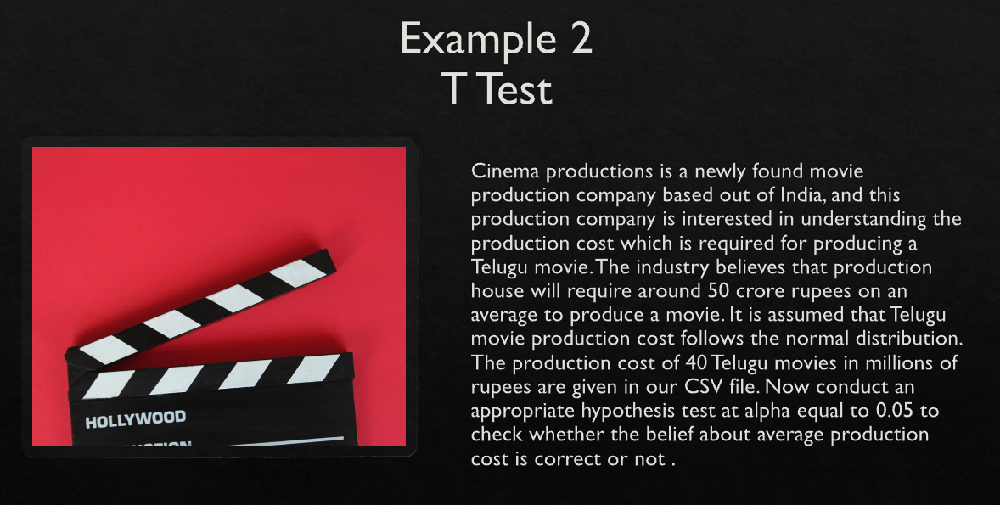

In [30]:
# given 
pop_mean = 500 # 50 cr
n = 40
alpha = 0.05

In [31]:
df = pd.read_csv("/Users/saprativasarkar/Desktop/ML/10_Python_and_OOPS/11_statistics/dataset/movie_cost_40_movies.csv")
df.head()

,movie_cost
0,402
1,648
2,570
3,406
4,371


In [33]:
sample_mean = df['movie_cost'].mean()
sample_std = df['movie_cost'].std()
print(sample_mean)
print(sample_std)

502.625
109.68058227510068


In [37]:
t_test_statistics = (sample_mean-pop_mean)/(sample_std/sqrt(n))
t_test_statistics

0.15136642577482848

In [35]:
stats.ttest_1samp(df['movie_cost'],pop_mean)

TtestResult(statistic=0.15136642577482848, pvalue=0.8804669475325584, df=39)

In [39]:
# 0.880 > 0.05
# null hypothesis accepted
# avergage movie cost 50 crores

##### Two sample t test

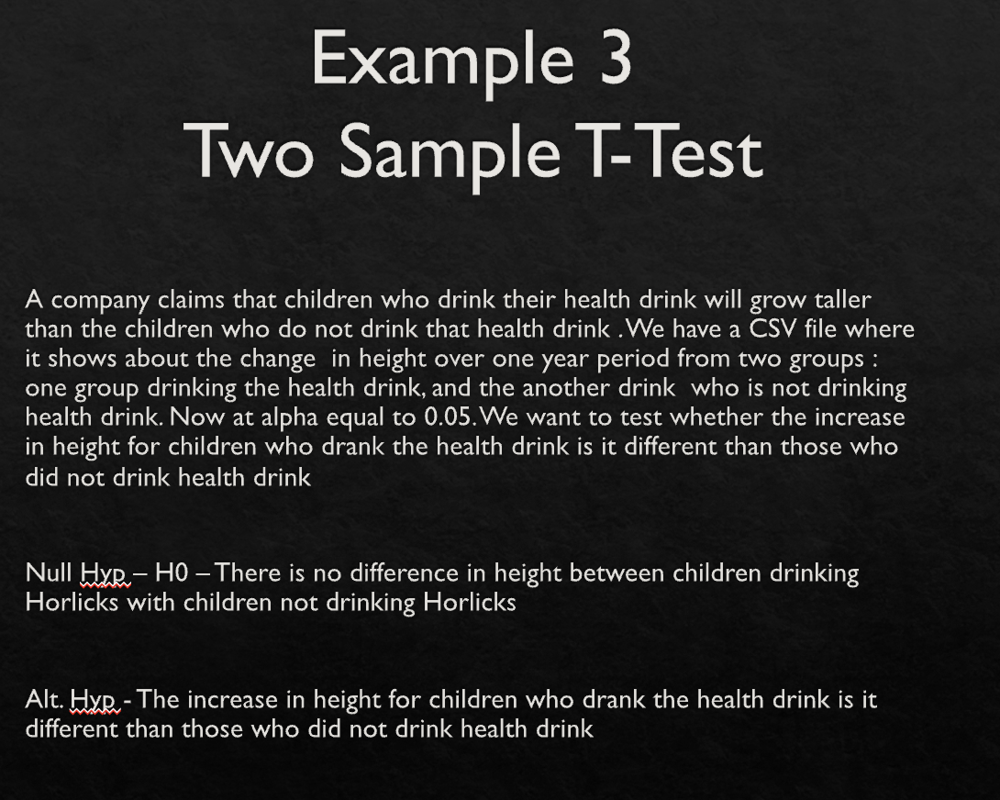

In [40]:
data = {'drink_no': [10.0, 5.5, 5.7, 6.3, 5.7, 5.4, 5.4, 5.5, 5.5, 6.3, 6.3, 5.4, 5.7, 5.4, 5.7, 5.7, 5.7, 5.5, 5.5, 5.7, 5.5, 5.4, 5.5, 5.7, 5.7, 5.5, 5.7, 5.5, 5.7, 5.5, 5.5, 10.0, 5.7, 10.0, 5.7, 5.4, 5.7, 5.5, 5.5, 5.7, 5.4, 5.7, 5.5, 5.5, 5.7, 5.7, 5.7, 5.4, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.5, 5.5, 5.4, 5.5, 5.7, 5.5, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.5, 5.5, 5.7, 5.7, 5.7, 5.5, 5.7, 5.7, 5.7, 5.5, 5.5, 5.7, 5.7, 5.7, 5.7, 5.5, 5.7, 5.7, 5.5, 5.7, 5.7, 5.5, 5.7, 5.5, 5.7, 5.5, 5.7, 5.7, 5.7, 5.5, 5.7],
        'drink_yes': [6.8, 8.5, 10.2, 9.6, 10.2, 6.8, 6.8, 8.5, 8.5, 9.6, 9.6, 6.8, 10.2, 6.8, 10.2, 10.2, 10.2, 8.5, 8.5, 10.2, 8.5, 6.8, 8.5, 10.2, 10.2, 8.5, 10.2, 8.5, 10.2, 8.5, 8.5, 6.8, 10.2, 6.8, 10.2, 6.8, 10.2, 8.5, 8.5, 10.2, 6.8, 10.2, 8.5, 8.5, 10.2, 10.2, 10.2, 6.8, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 8.5, 8.5, 6.8, 8.5, 10.2, 8.5, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 10.2, 8.5, 8.5, 10.2, 10.2, 10.2, 8.5, 10.2, 10.2, 10.2, 8.5, 8.5, 10.2, 10.2, 10.2, 10.2, 8.5, 10.2, 10.2, 8.5, 10.2, 10.2, 8.5, 10.2, 8.5, 10.2, 8.5, 10.2, 10.2, 10.2, 8.5, 10.2]}
df = pd.DataFrame(data)
df.head()

,drink_no,drink_yes
0,10.0,6.8
1,5.5,8.5
2,5.7,10.2
3,6.3,9.6
4,5.7,10.2


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='drink_no', ylabel='Density'>

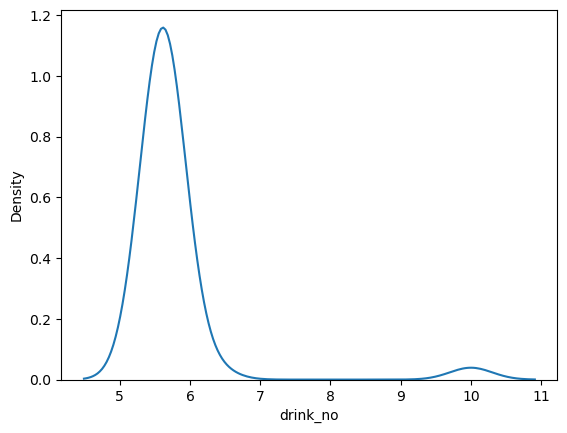

In [43]:
sns.kdeplot(df['drink_no'])

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='drink_yes', ylabel='Density'>

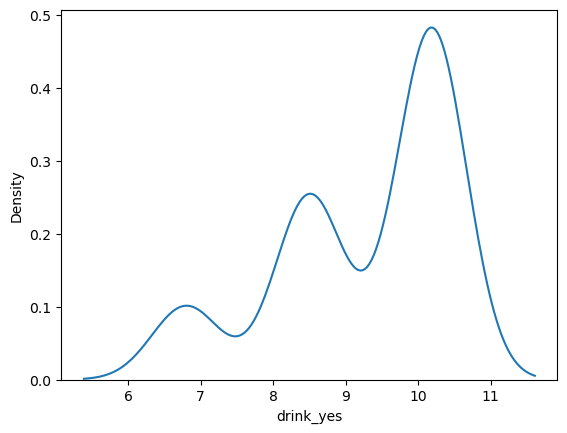

In [44]:
sns.kdeplot(df['drink_yes'])

In [45]:
from scipy import stats
stats.ttest_ind(df['drink_yes'], df['drink_no'])

TtestResult(statistic=25.09892202837925, pvalue=1.0175910359467221e-63, df=200.0)

In [46]:
round(1.0175910359467221e-63,3)

0.0

In [47]:
# p value < 0.05
# reject null hypothesis
# health drink has an impact in height

##### Paired Sample t test

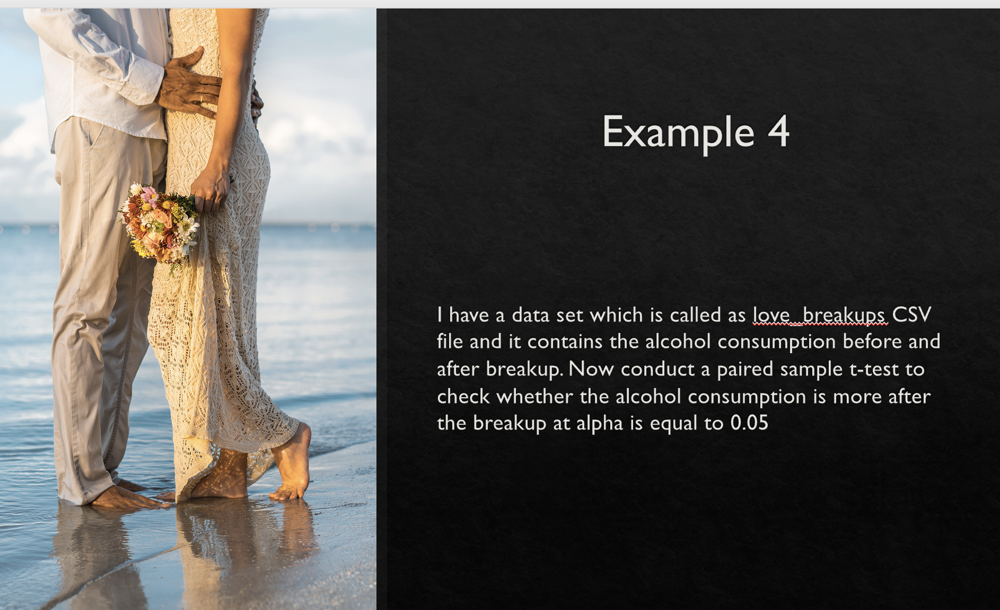

In [48]:
np.random.seed(42)
pre_breakup_data = np.random.randint(300, 500, size=100)
post_breakup_data = pre_breakup_data + np.random.randint(-50, 50, size=100)
post_breakup_data = np.clip(post_breakup_data, 250, 550)
data = {'pre_Breakup': pre_breakup_data,
        'post_Breakup': post_breakup_data}
df = pd.DataFrame(data)
df.head()

,pre_Breakup,post_Breakup
0,402,366
1,479,473
2,392,406
3,314,352
4,406,426


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


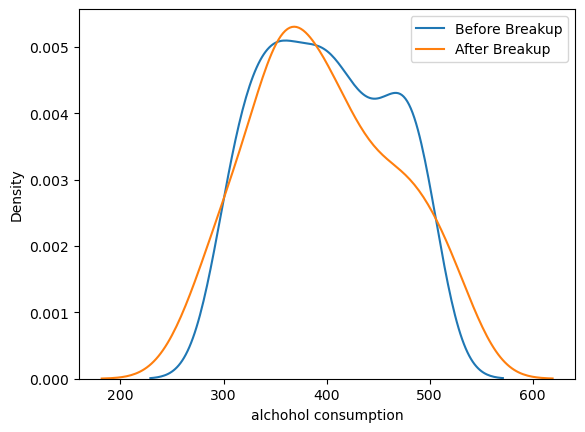

In [57]:
sns.kdeplot(df["pre_Breakup"],label="Before Breakup")
sns.kdeplot(df["post_Breakup"],label="After Breakup")
plt.xlabel("alchohol consumption")
plt.legend()
plt.show()

In [58]:
from scipy import stats
stats.ttest_rel(df['pre_Breakup'], df['post_Breakup'])

TtestResult(statistic=0.7971915522143197, pvalue=0.4272476093762818, df=99)

In [ ]:
# p value < 0.05 
# null hypothesis rejected
# alchohol consumpion is related to breakup

##### Chi Square Test

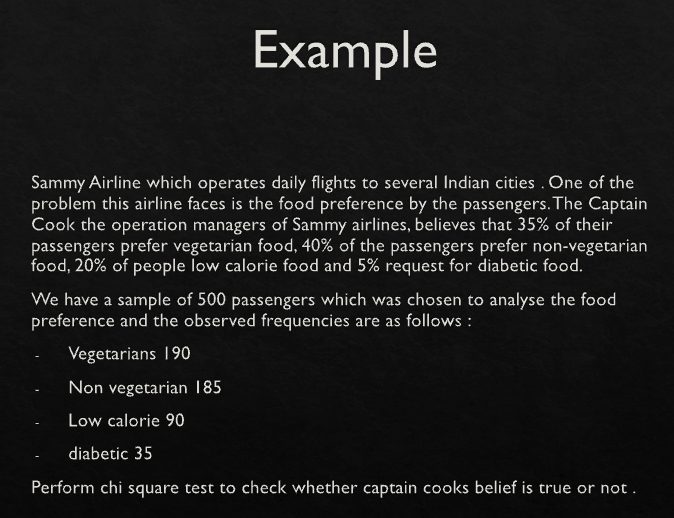

In [59]:
f_obs = [190,185,90,35]
f_exp = [0.35*500, 0.4*500, 0.2*500, 0.05*500]

In [60]:
f_exp

[175.0, 200.0, 100.0, 25.0]

In [61]:
from scipy import stats
stats.chisquare(f_obs,f_exp)

Power_divergenceResult(statistic=7.410714285714286, pvalue=0.05989751420084909)

In [62]:
# p value > 0.05 
# null hypothesis accepted
# captains believe is correct

##### ANOVA Test

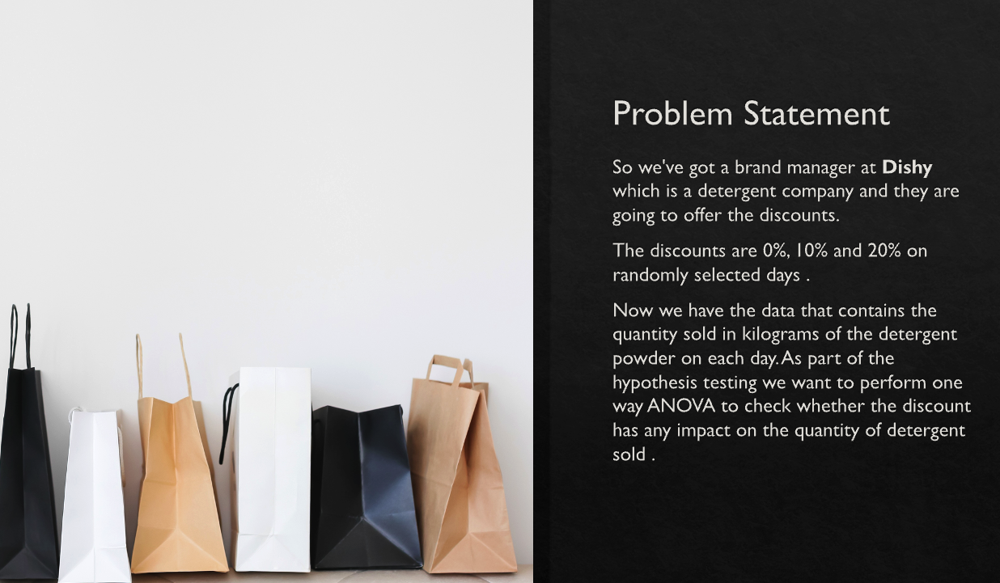

In [63]:
np.random.seed(42)
discount_0_data = np.random.randint(20, 45, size=100)
discount_10_data = np.random.randint(30, 55, size=100)
discount_20_data = np.random.randint(35, 60, size=100)
data = {'discount_0': discount_0_data,
        'discount_10': discount_10_data,
        'discount_20': discount_20_data}
df = pd.DataFrame(data)
df.head()

,discount_0,discount_10,discount_20
0,26,54,58
1,39,36,43
2,34,38,54
3,30,53,51
4,27,30,51


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


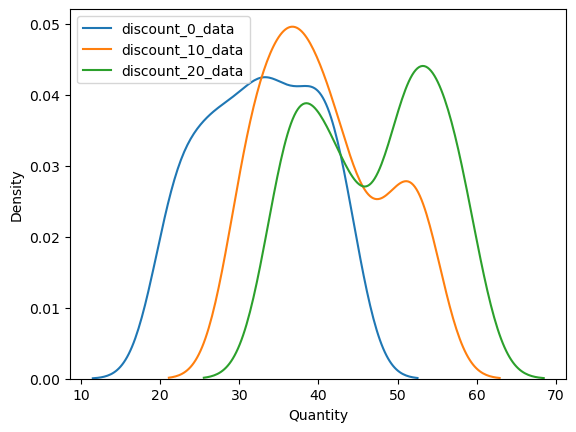

In [65]:
sns.kdeplot(df['discount_0'],label='discount_0_data')
sns.kdeplot(df['discount_10'],label='discount_10_data')
sns.kdeplot(df['discount_20'],label='discount_20_data')
plt.xlabel("Quantity")
plt.legend()
plt.show()

In [66]:
from scipy import stats
stats.f_oneway(df['discount_0'],
               df['discount_10'],
               df['discount_20'])

F_onewayResult(statistic=91.2950471970329, pvalue=1.2448223029447994e-31)

In [67]:
# p value < 0.05 
# null hypothesis rejected
# discount has a statistically significantt impact